
# Lab 4 Spatial operations, part 2

### Imports

First, we will perform the required imports.

In [1]:
import numpy as np
from skimage import io, morphology, util, filters
from scipy import ndimage
import cv2 as cv
import matplotlib.pyplot as plt

Let us retrieve the data (images) from a dropbox source. 

In [2]:
!rm -fr sample_data
!wget -q -O bananas.jpg https://www.dropbox.com/s/ylnsxkjmpnbjqin/bananas.jpg?dl=0
!wget -q -O pieces.png https://www.dropbox.com/s/ru423idpvyrdi0p/pieces.png?dl=0
!wget -q -O shapes.jpg https://www.dropbox.com/s/vaoe6ls1sptxp5g/shapes.jpg?dl=0
!wget -q -O rice.png https://www.dropbox.com/s/12s5jy9cs8yukch/rice.png?dl=0
!wget -q -O keyboard.jpg https://www.dropbox.com/s/7iaqembup0aj5hy/keyboard.jpg?dl=0


'rm' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


We will load the `shapes.jpg` image, and present it:

shapes is of shape 480x640


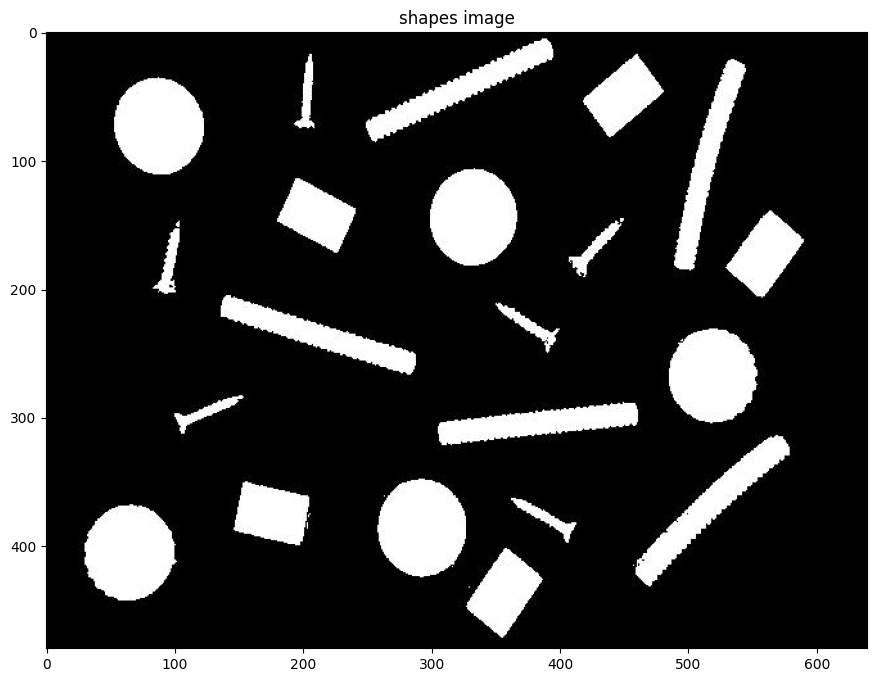

In [3]:
# Load image in a gray scale format
shapes = io.imread('shapes.jpg', as_gray=True);
m,n = shapes.shape;
print(f'shapes is of shape {m}x{n}');

fig = plt.figure(figsize = (16,8));
title = "shapes image";
plt.imshow(shapes, cmap="gray");
plt.title(title);


Now, we will try and live only the circles using morphology operations. We will exploit the fact that the other shapes are thinner than the circles. We will use a dilation operation to reduce the thin shapes, followed by erosion to restore the, now, dilated thick shapes (circles). A dilation followed by erosion is an open operation. We will use the same structuring element for both. A disk seems like a good choice here. Since the diameter of the circles is approximately 50 pixels, and the rectangles are about 40 pixels, we will start with a disk with a radius of 20.

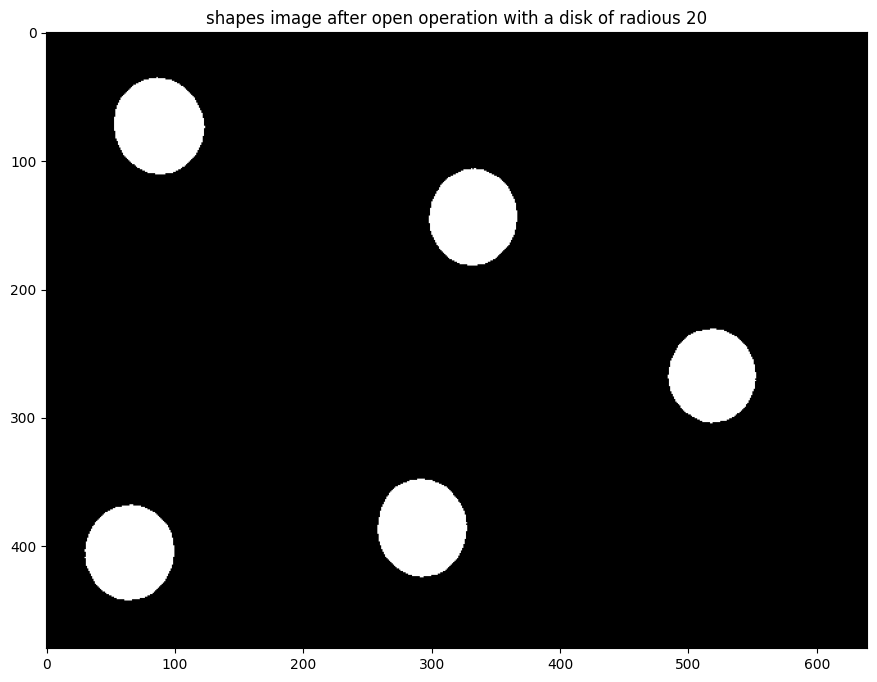

In [4]:
d = morphology.disk(radius=20);
shapes_opened = ndimage.binary_opening(shapes, structure = d);

fig = plt.figure(figsize = (16,8));
title = "shapes image after open operation with a disk of radious 20";
plt.imshow(shapes_opened, cmap="gray");
plt.title(title);

This does a pretty  good job. Of curse, we lose a bit of information, as the restored circles are not equal to the original ones. 

Now, we move on to the `pieces.png` image. We will try reasonable thresholding to turn it into a binary image. Since the background is bright and the objects are dark, we will set any pixel lower than the threshold to $1$ while keeping the pixels higher than the threshold set to $0$.

pieces is of shape 480x640


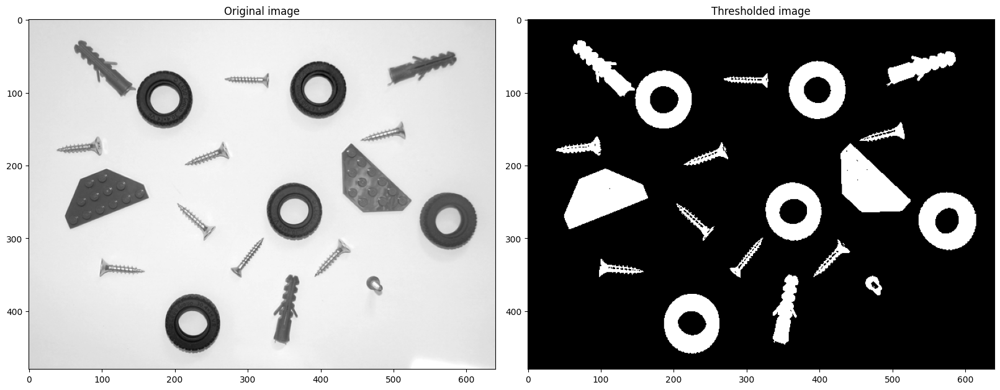

In [5]:
# Load image in a gray scale format
pieces = io.imread('pieces.png', as_gray=True);
m,n = pieces.shape;
print(f'pieces is of shape {m}x{n}');

threshold = 200;
pieces_t = np.zeros(pieces.shape);
pieces_t[pieces<threshold]=1;

fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "Original image";
axs[0].imshow(pieces, cmap="gray");
axs[0].set_title(title);
title = "Thresholded image";
axs[1].imshow(pieces_t, cmap="gray");
axs[1].set_title(title);

This result seems reasonable. We proceed to try and eliminate the screws. We will exploit the "shiny" part, which translated to black in the thresholding operation. This means that the screws are relatively narrow. We will try an `open` operation again. We will start with a disk of radius $5$, and move up to $10$. We will leave the code with the best result. 

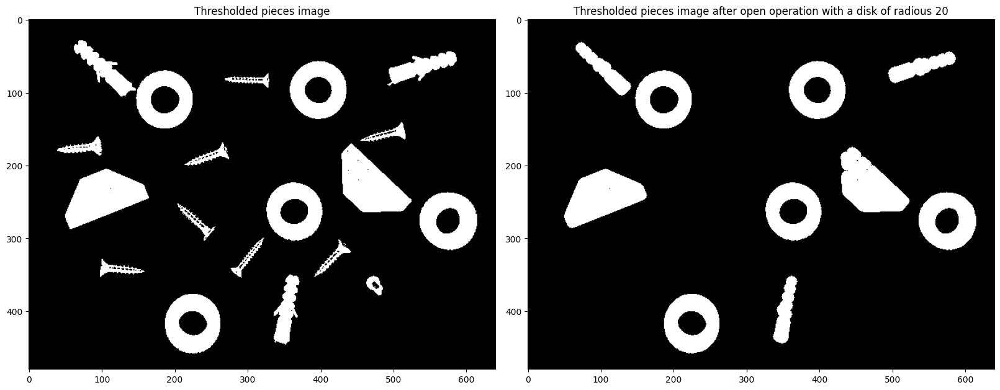

In [6]:
d = morphology.disk(radius=7);
pieces_opened = ndimage.binary_opening(pieces_t, structure = d);


fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "Thresholded pieces image";
axs[0].imshow(pieces_t, cmap="gray");
axs[0].set_title(title);
title = "Thresholded pieces image after open operation with a disk of radious 20";
axs[1].imshow(pieces_opened, cmap="gray");
axs[1].set_title(title);




A radius of 7 eliminated all the screws while keeping the other objects. However, we have lost some small details in the other objects, such as the 'all plugs' flaps. The most right lego piece came out of the thresholding with small halls in it due to glare from the image lighting. These halls grow after the `open` operation and the general shape of the lego piece is harmed. 

We move on to the `rice.png` image. Since it contains some salt and pepper noise, we will use open with a small disk (radius of $1$), to deal with the pepper, and closing to deal with the salt. 

In [10]:
# Load image in a gray scale format
rice = io.imread('rice.png', as_gray=True);
m,n = rice.shape;
print(f'rice is of shape {m}x{n}');

d = morphology.disk(radius=2);
rice_opened = morphology.opening(rice, selem = d );
rice_opened_closed = morphology.closing(rice_opened, selem = d);

fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "Original image";
axs[0].imshow(rice, cmap="gray");
axs[0].set_title(title);
title = "Clean image";
axs[1].imshow(rice_opened_closed, cmap="gray");
axs[1].set_title(title);

rice is of shape 256x256


NameError: name 'selem' is not defined

This worked nicely. However, we will try another method. We will try opening the image and substructing the opened image from the original image. This should remove the gradient in the background lighting. The operation is called a top-hat operation. We will follow this operation with another opening and closing to eliminate the salt and pepper. 

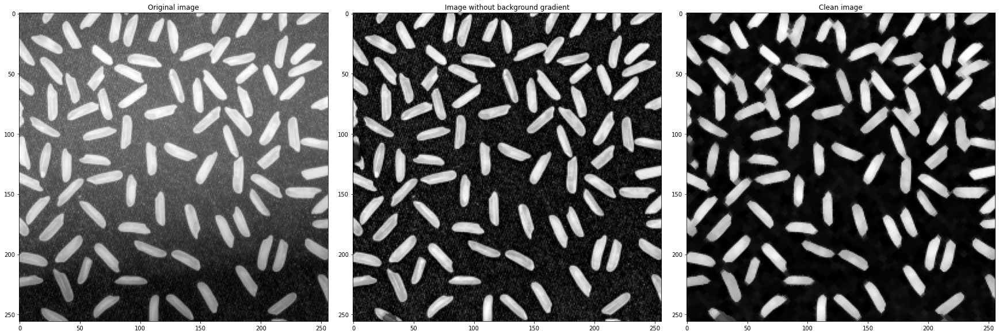

In [ ]:
d = morphology.disk(radius=6);
rice_opened = morphology.opening(rice, selem = d);
rice_no_grad = rice-rice_opened; 

d = morphology.disk(radius=2);
rice_clean = morphology.opening(rice_no_grad, selem = d);
rice_clean = morphology.closing(rice_clean, selem = d);


fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "Original image";
axs[0].imshow(rice, cmap="gray");
axs[0].set_title(title);
title = "Image without background gradient";
axs[1].imshow(rice_no_grad, cmap="gray");
axs[1].set_title(title);
title = "Clean image";
axs[2].imshow(rice_clean, cmap="gray");
axs[2].set_title(title);

This result is better, however, it is hard to achieve a clean image using only morphology operations. 

To preserve the gradient while eliminating the rice, we will do a simple opening operation. A big enough disk will open the grains.

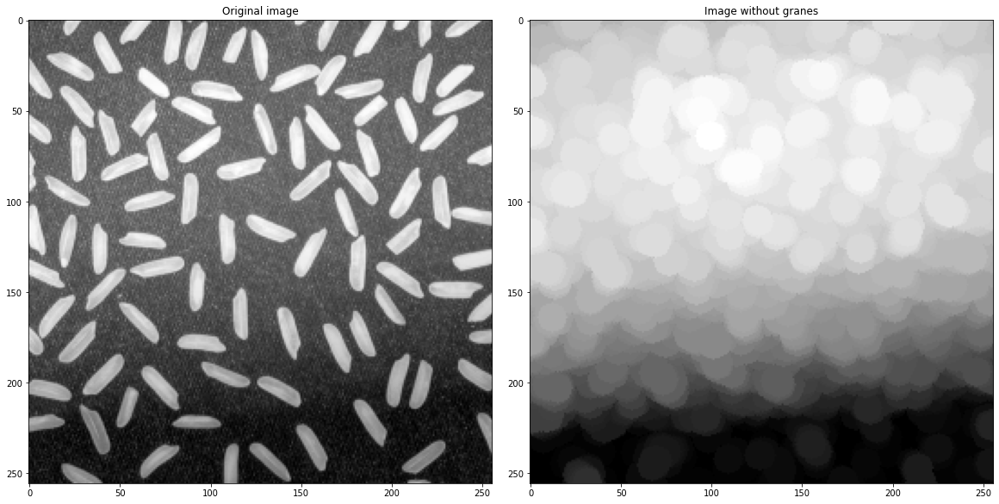

In [ ]:
d = morphology.disk(radius=8);
rice_opened = morphology.opening(rice, selem = d);

fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "Original image";
axs[0].imshow(rice, cmap="gray");
axs[0].set_title(title);
title = "Image without granes";
axs[1].imshow(rice_opened, cmap="gray");
axs[1].set_title(title);


We can see the gradient, and we have eliminated the grains. However, the gradient is not smooth and further smoothing may be needed, depending on the task. 

We will subtract the gradient from the original image and present the resulting image and the histogram. This is essentially a top-hat operation again. 

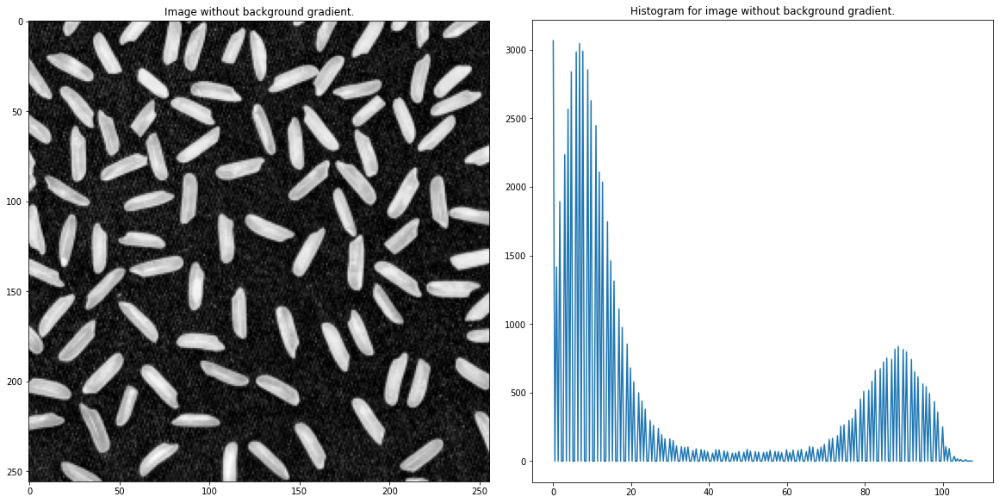

In [ ]:
rice_no_grad = rice - rice_opened;
histogram, bin_edges = np.histogram(rice_no_grad, bins=256, range=(0, rice_no_grad.max()));

fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "Image without background gradient.";
axs[0].imshow(rice_no_grad, cmap="gray");
axs[0].set_title(title);
title = "Histogram for image without background gradient.";
axs[1].plot(bin_edges[0:-1], histogram);
axs[1].set_title(title);


We can see that the background gradient is reduced. However, there is still noise in the background. The gray shade is lower than the values of the rice grains. A quick look at the histogram implies that a threshold of $60$ will probably darken the background noise. 

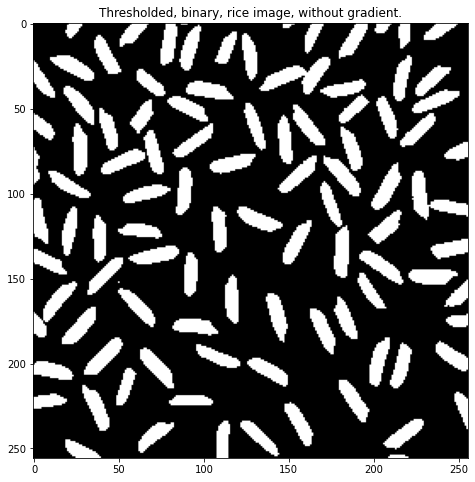

In [ ]:
threshold = 60;
rice_t = np.zeros(rice_no_grad.shape);
rice_t[rice_no_grad>threshold]=1;

fig = plt.figure(figsize = (16,8));
title = "Thresholded, binary, rice image, without gradient.";
plt.imshow(rice_t, cmap="gray");
plt.title(title);

We have isolated most of the rice grains using the top-hat operation, combined with thresholding. 

We will load and present the `keyboard.jpg` image. 


keyboard is of shape 246x594


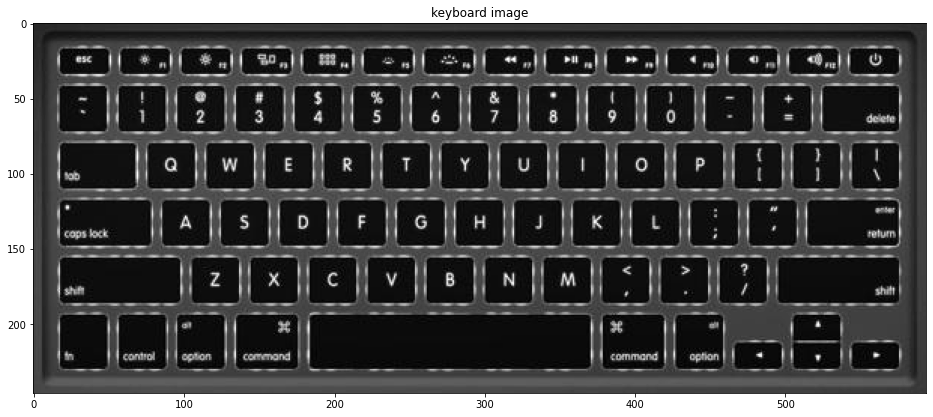

In [ ]:
# Load image in a gray scale format
keyboard = io.imread('keyboard.jpg', as_gray=True);
m,n = keyboard.shape;
print(f'keyboard is of shape {m}x{n}');

fig = plt.figure(figsize = (16,8));
title = "keyboard image";
plt.imshow(keyboard, cmap="gray");
plt.title(title);

Using the line and column structure elements, we will perform an erosion on the image.

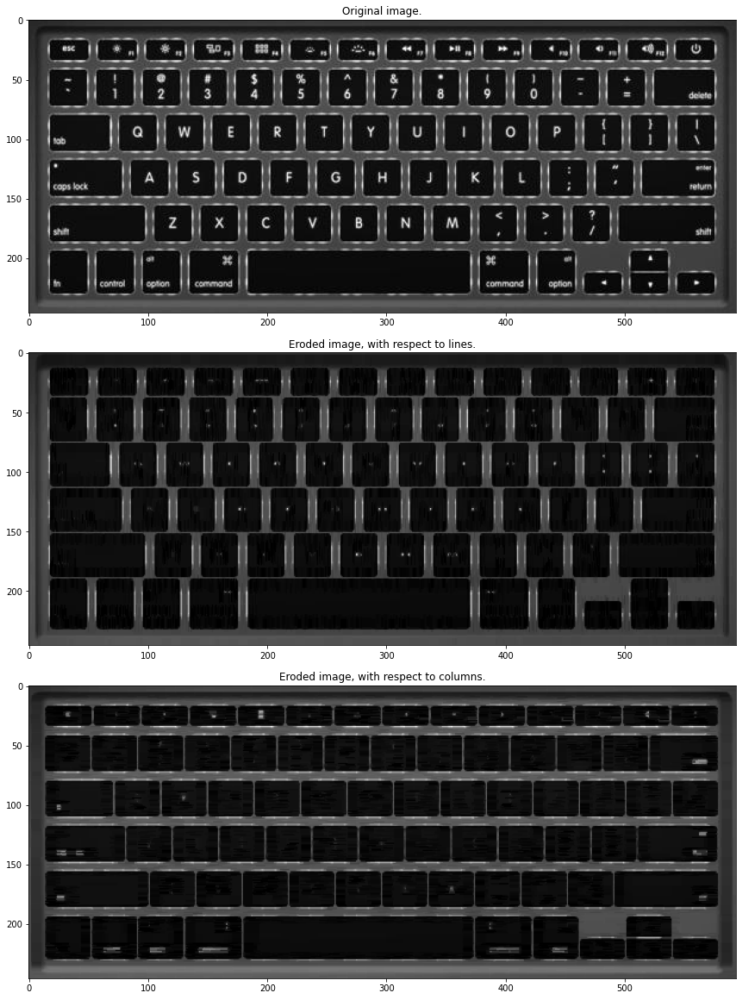

In [ ]:

column = morphology.selem.rectangle(1, 8);
line = morphology.selem.rectangle(8, 1);

keyboard_eroded_l = morphology.erosion(keyboard, selem = line);
keyboard_eroded_c = morphology.erosion(keyboard, selem = column);

fig, axs = plt.subplots(3,1,constrained_layout=True,figsize = (16,16));
title = "Original image.";
axs[0].imshow(keyboard, cmap="gray");
axs[0].set_title(title);
title = "Eroded image, with respect to lines.";
axs[1].imshow(keyboard_eroded_l, cmap="gray");
axs[1].set_title(title);
title = "Eroded image, with respect to columns.";
axs[2].imshow(keyboard_eroded_c, cmap="gray");
axs[2].set_title(title);


The line structural element produces an image with very sharp horizontal lines, while the column element preserves the sharpness of the vertical lines. Diagonal lines are blurred and smudged. We will add them and apply a threshold. 

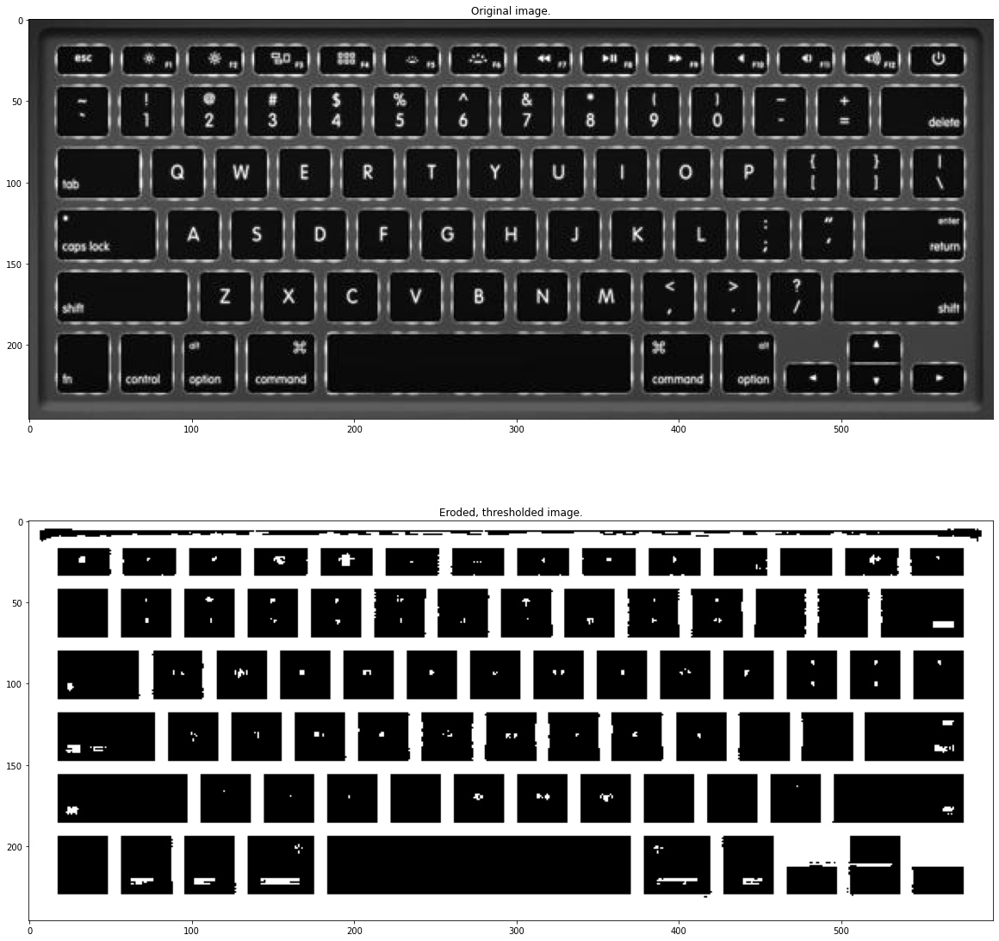

In [ ]:
keyboard_eroded = keyboard_eroded_l+keyboard_eroded_c;

keyboard_t = np.zeros(keyboard.shape);
keyboard_t[keyboard_eroded>0.2*keyboard_eroded.max()] = 1;

fig, axs = plt.subplots(2,1,constrained_layout=True,figsize = (16,16));
title = "Original image.";
axs[0].imshow(keyboard, cmap="gray");
axs[0].set_title(title);
title = "Eroded, thresholded image.";
axs[1].imshow(keyboard_t, cmap="gray");
axs[1].set_title(title);



The result is sort of isolation of the keyboard's keys in black, and an emphesis\thikennning on the borders between the keys. There are small error pixels at the top, and around the arrow keys mostly. 

We will load and present the `bananas.jpg` image. 

bananas is of shape 300x400


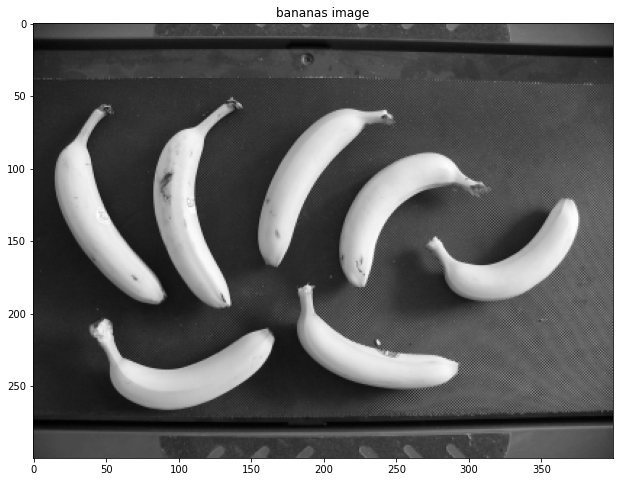

In [ ]:
# Load image in a gray scale format
bananas = io.imread('bananas.jpg', as_gray=True);
m,n = bananas.shape;
print(f'bananas is of shape {m}x{n}');

fig = plt.figure(figsize = (16,8));
title = "bananas image";
plt.imshow(bananas, cmap="gray");
plt.title(title);

We wish to filter the image using the filtering element:
$$h = 
 \begin{pmatrix}
  0 & -a & 0 \\
  -a & 1+4a & -a \\
  0  & -a  & 0  \\
 \end{pmatrix}$$
We will produce a `for` loop for different values of `a`. 

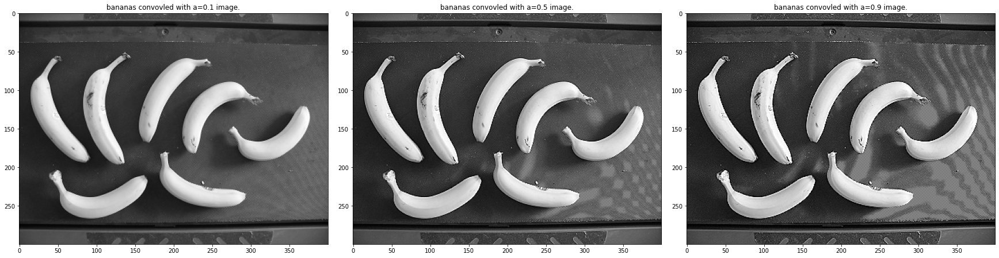

In [ ]:
fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));

for i,a in enumerate([0.1,0.5,0.9]):
  h = np.zeros((3,3));
  h[0,1] = -a;
  h[2,1] = -a;
  h[1,0] = -a;
  h[1,2] = -a;
  h[1,1] = 1+4*a;
  bananas_filtered = ndimage.filters.convolve(bananas.astype(np.double),h);
  bananas_filtered[bananas_filtered<0]=0;
  bananas_filtered[bananas_filtered>255]=255;
  bananas_filtered = bananas_filtered.astype(np.uint8)
  title = f"bananas convovled with a={a} image.";
  axs[i].imshow(bananas_filtered, cmap="gray");
  axs[i].set_title(title);


This is an edge-sharpening filter. If we apply it to a $3\times3$ patch with a constant value, we will not change the value of the center pixel. However, if it is an edge with a high vertical\horisontal gradient on any side, this gradient will become greater. The value of `a` controls the gradient sharpening. The larger `a` is, the higher the difference  will become. However, this difference can exceed the interval of $[0,255]$, Hence, trimming is required. 

We will add an S&P noise with a value of 4\%.

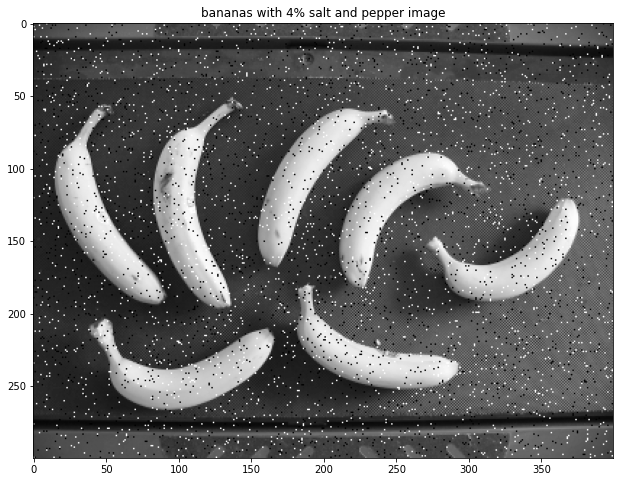

In [ ]:
bananas_s_p = util.random_noise(bananas, mode='s&p', amount=0.04);

fig = plt.figure(figsize = (16,8));
title = "bananas with 4% salt and pepper image";
plt.imshow(bananas_s_p, cmap="gray");
plt.title(title);

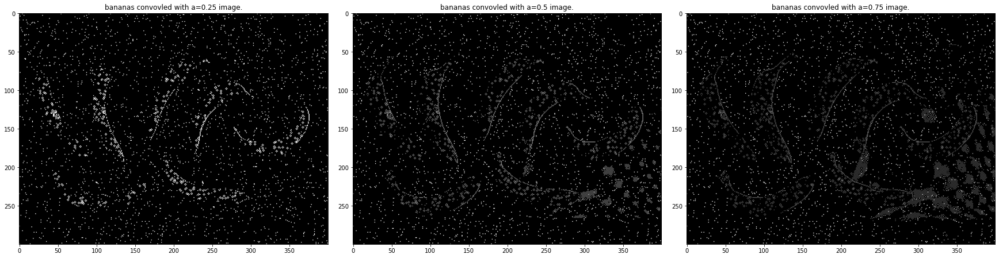

In [ ]:
fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));

for i,a in enumerate([0.25,0.5,0.75]):
  h = np.zeros((3,3));
  h[0,1] = -a;
  h[2,1] = -a;
  h[1,0] = -a;
  h[1,2] = -a;
  h[1,1] = 1+4*a;
  #bananas_filtered = ndimage.convolve(bananas,h);
  bananas_filtered = ndimage.filters.convolve(bananas_s_p,h);
  bananas_filtered[bananas_filtered<0]=0;
  bananas_filtered[bananas_filtered>255]=255;
  bananas_filtered = bananas_filtered.astype(np.uint8)
  title = f"bananas convovled with a={a} image.";
  axs[i].imshow(bananas_filtered, cmap="gray");
  axs[i].set_title(title);

It seems like salt and pepper is a problematic noise for such a filter. This filter heightens the difference of a pixel from its surroundings. For a smooth image, the filter will simply do nothing. However, due to the high difference of each noised pixel from its surrounding for S&P noise, this difference is heightened, resulting in a sharpening of the salt. Also, due to the relatively high value of the salt, the other pixels are threshold into a very dark intensity.  

We saw in tutorial 3 that a median filter performs relatively well for S&P noise. Hence, we suggest applying a median filter before the edge sharpening filter. We will use a filter of the same size ($3\times 3$). 

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


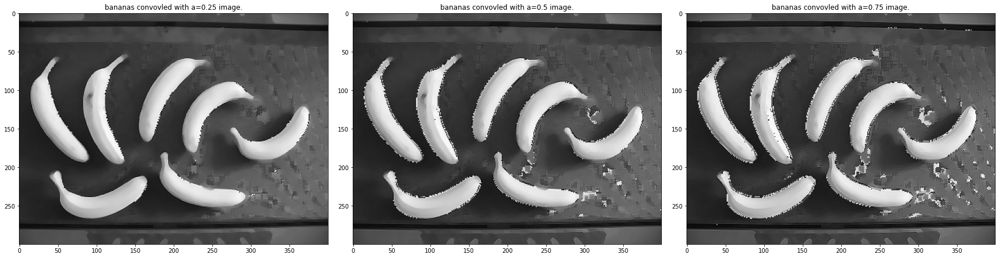

In [ ]:
# Median filtering
w = 7
footprint = morphology.square(w)
fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));

for i,a in enumerate([0.25,0.5,0.75]):
  h = np.zeros((3,3));
  h[0,1] = -a;
  h[2,1] = -a;
  h[1,0] = -a;
  h[1,2] = -a;
  h[1,1] = 1+4*a;
  median = filters.rank.median(bananas_s_p, footprint)
  bananas_filtered = ndimage.filters.convolve(median,h);
  bananas_filtered[bananas_filtered<0]=0;
  bananas_filtered[bananas_filtered>255]=255;
  bananas_filtered = bananas_filtered.astype(np.uint8)
  title = f"bananas convovled with a={a} image.";
  axs[i].imshow(bananas_filtered, cmap="gray");
  axs[i].set_title(title);
  

This solution has eliminated the influence of noise. We have received sharper edges. However, the edges are pixelized and there is a form of inconsistency for the 'flow' of the edge.

We move on to the template matching section. This code is a solution with placeholders (noise images), but you should replace the images with your own, this section will work only with the proper naming of the images.

In the following section, we will load and present the images and a template.  

me images is of shape 300x300


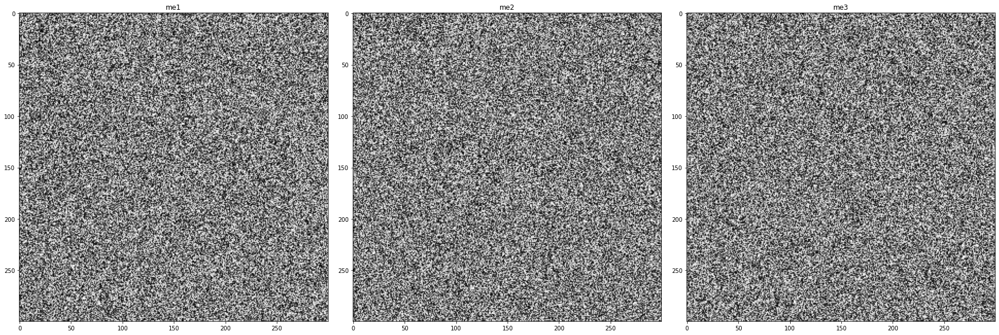

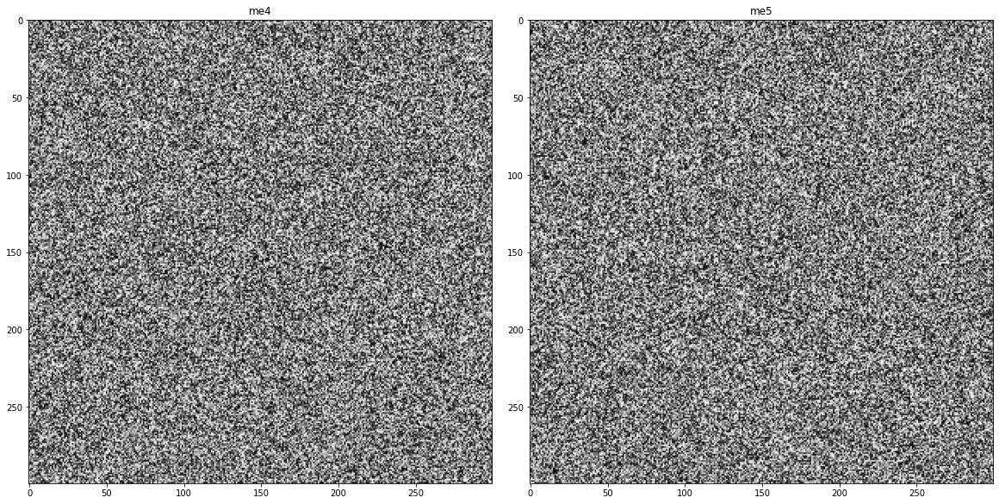

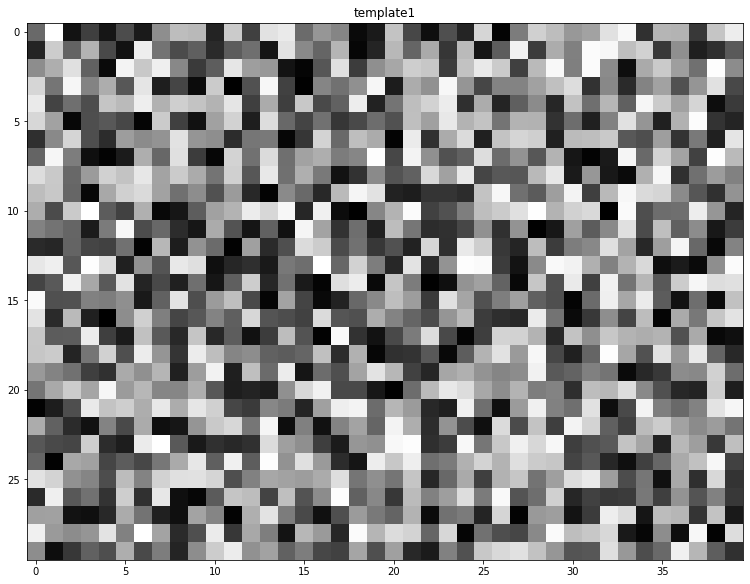

In [ ]:
# Generate random images in a gray scale format. We are using float32 for the latter cv funtions.
# Do not give any attention to the size of the random image. 
me1 = np.random.uniform(low=0, high=1, size=(300,300)).astype(np.float32)
me2 = np.random.uniform(low=0, high=1, size=(300,300)).astype(np.float32)
me3 = np.random.uniform(low=0, high=1, size=(300,300)).astype(np.float32)
me4 = np.random.uniform(low=0, high=1, size=(300,300)).astype(np.float32)
me5 = np.random.uniform(low=0, high=1, size=(300,300)).astype(np.float32)

# This commented code will load real images:
# me1 = io.imread('me1.JPG', as_gray=True).astype(np.float32)
# me2 = io.imread('me2.JPG', as_gray=True).astype(np.float32)
# me3 = io.imread('me3.JPG', as_gray=True).astype(np.float32)
# me4 = io.imread('me4.JPG', as_gray=True).astype(np.float32)
# me5 = io.imread('me5.JPG', as_gray=True).astype(np.float32)

m,n = me5.shape;
print(f'me images is of shape {m}x{n}');

fig, axs = plt.subplots(1,3,constrained_layout=True,figsize = (24,8));
title = "me1";
axs[0].imshow(me1, cmap="gray");
axs[0].set_title(title);
title = "me2";
axs[1].imshow(me2, cmap="gray");
axs[1].set_title(title);
title = "me3";
axs[2].imshow(me3, cmap="gray");
axs[2].set_title(title);

fig, axs = plt.subplots(1,2,constrained_layout=True,figsize = (16,8));
title = "me4";
axs[0].imshow(me4, cmap="gray");
axs[0].set_title(title);
title = "me5";
axs[1].imshow(me5, cmap="gray");
axs[1].set_title(title);

# Iint a rnadom template
template1 = np.random.uniform(low=0, high=1, size=(30,40)).astype(np.float32)
# Commented code to load a rela template
# template1 = io.imread('Template1.JPG', as_gray=True).astype(np.float32)

# More tan a single template can be loaded
fig, axs = plt.subplots(1,1,constrained_layout=True,figsize = (24,8));
title = "template1";
plt.imshow(template1, cmap="gray");
plt.title(title);
# title = "template2";
# axs[1].imshow(template2, cmap="gray");
# axs[1].set_title(title);
# title = "template3";
# axs[2].imshow(template3, cmap="gray");
# axs[2].set_title(title);

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


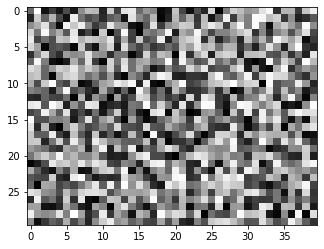

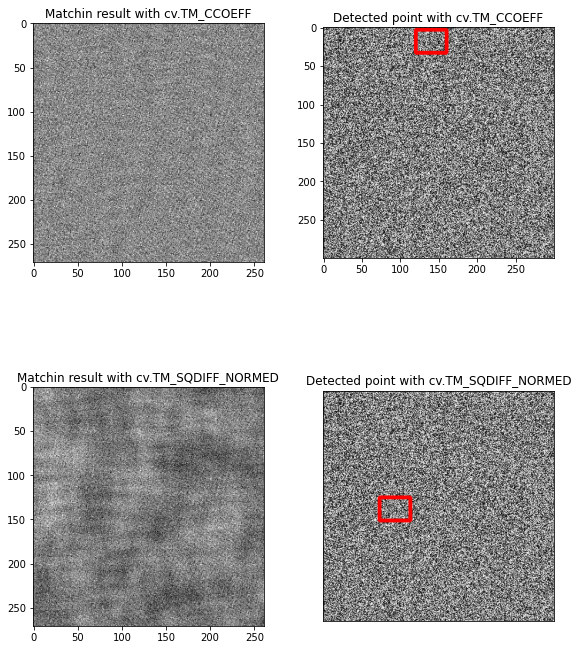

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


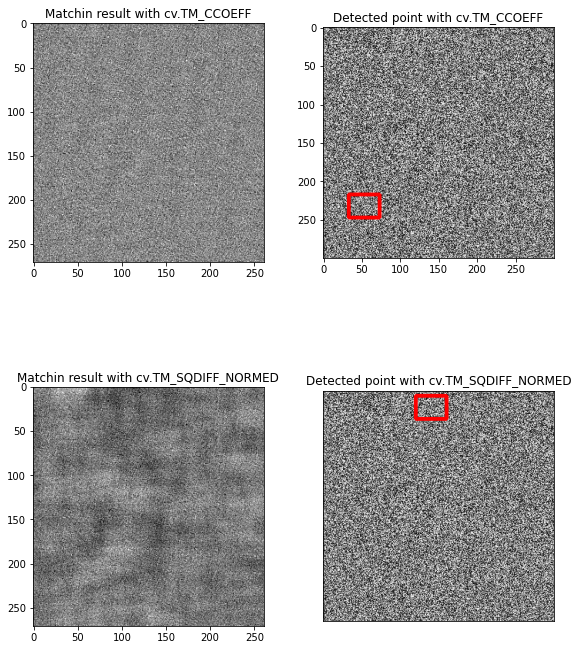

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


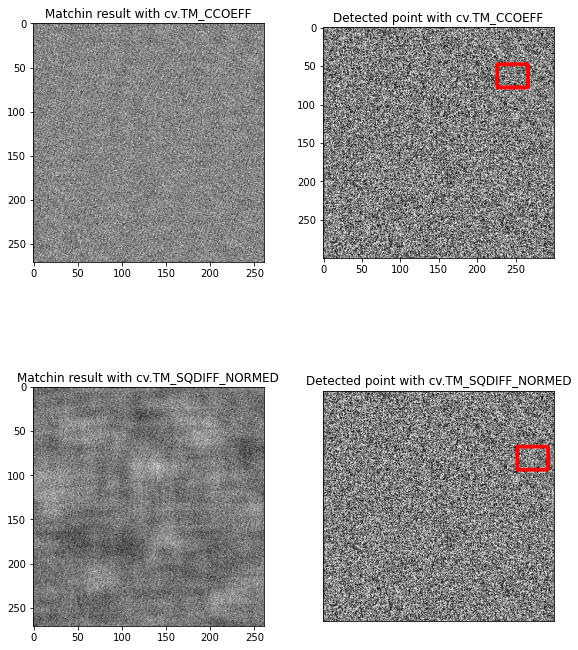

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


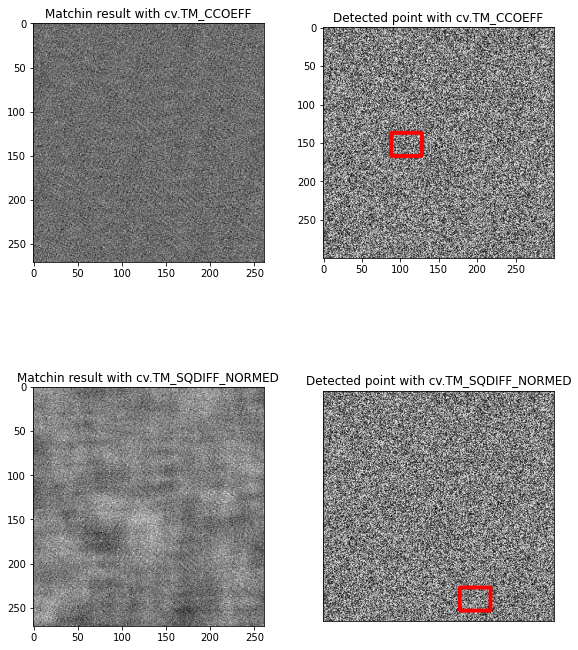

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


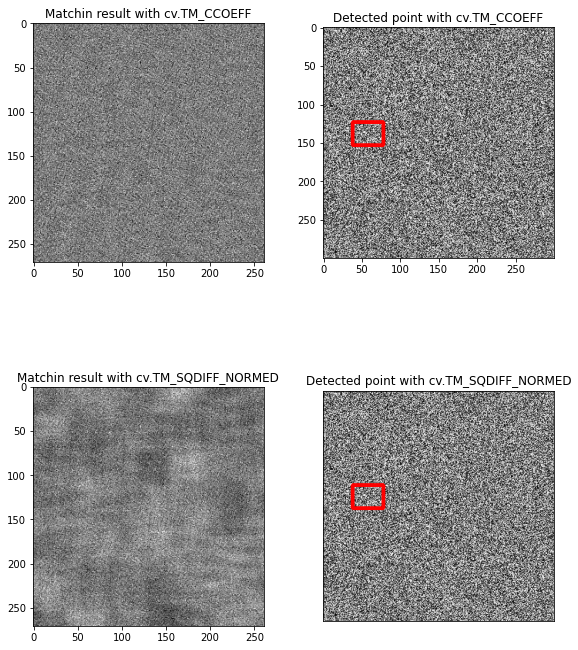

In [ ]:
# Both methods
methods = [cv.TM_CCOEFF, cv.TM_SQDIFF_NORMED]
# All images methods
my_images = [me1, me2, me3, me4, me5]
# All templates (you may play arroung with more templates)
templates = [template1]#, template2, template3]

# Iterate templates, images and methods:
for T in templates:
  plt.imshow(T, cmap="gray")
  h, w = T.shape
  for me in my_images:
    fig, axs = plt.subplots(2,2,constrained_layout=True,figsize = (8,10));

    # Apply template Matching with first method
    res = cv.matchTemplate(me,T,methods[0])
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    me_temp = me.copy()
    top_left = max_loc
    
    bottom_right = (top_left[0] + w, top_left[1] + h)
    me_temp = cv.rectangle(cv.cvtColor(me_temp, cv.COLOR_GRAY2RGB), top_left, bottom_right, 255, 4)

    title = f"Matchin result with cv.TM_CCOEFF";
    axs[0,0].imshow(res, cmap="gray")
    axs[0,0].set_title(title), plt.xticks([]), plt.yticks([])
    title = f"Detected point with cv.TM_CCOEFF";
    axs[0,1].imshow(me_temp, cmap="gray");
    axs[0,1].set_title(title), plt.xticks([]), plt.yticks([])

    # Apply template Matching with second method
    res = cv.matchTemplate(me,T,methods[1])
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

    top_left = min_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    me = cv.rectangle(cv.cvtColor(me, cv.COLOR_GRAY2RGB), top_left, bottom_right, 255, 4)

    title = f"Matchin result with cv.TM_SQDIFF_NORMED";
    axs[1,0].imshow(res, cmap="gray")
    axs[1,0].set_title(title), plt.xticks([]), plt.yticks([])
    title = f"Detected point with cv.TM_SQDIFF_NORMED";
    axs[1,1].imshow(me, cmap="gray");
    axs[1,1].set_title(title), plt.xticks([]), plt.yticks([])
    plt.show()
    


This method achieves impressive results for locating a face given a template. This is because a human face is very distinguished from other things in a natural image. Try it with other objects (books? fruits?), and see the degradation in the performances. For a **face**, the results seem to have some robustness for changes in lighting, facial expression, background, and imaging angle. The most influential parameter seems to be the template and the way it was cropped. However, this is a bad practice for objects which do not have the strong identification features of a face. 